<a href="https://colab.research.google.com/github/pratikrathod08/football_detection/blob/main/football.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Thu Jan 18 18:10:33 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16383, done.
remote: Counting objects: 100% (277/277), done.
remote: Compressing objects: 100% (206/206), done.
remote: Total 16383 (delta 135), reused 144 (delta 71), pack-reused 16106
Receiving objects: 100% (16383/16383), 15.17 MiB | 19.81 MiB/s, done.
Resolving deltas: 100% (11172/11172), done.
/content/yolov5


In [3]:
## Install dependencies as necessary

!pip install pillow<10.1.0

!pip install -qr requirements.txt
import torch

from IPython.display import Image , clear_output   ## to display images
# from utils.google_utils import gdrive_download ## to download models datasets

/bin/bash: line 1: 10.1.0: No such file or directory
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 699.7/699.7 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.2.0 which is incompatible.


In [4]:
%pwd

'/content/yolov5'

In [5]:
%cd /content

/content


In [6]:
%pwd

'/content'

In [7]:
!pip install gdown


In [8]:
# import gdown

# url = "https://drive.google.com/file/d/1RstW1Ms4TwIUpNi4Lwdcy59pGL18kIms/view?usp=sharing"

# file_id = url.split("/")[-2]
# print(file_id)
# prefix = 'https://drive.google.com/uc?/export=download&id='
# gdown.download(prefix+ file_id)
# print('Data Downloaded')

In [9]:
!git clone https://github.com/pratikrathod08/football_detection.git

Cloning into 'football_detection'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 3 (delta 0), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (3/3), 1.68 MiB | 4.27 MiB/s, done.


In [10]:
!cp football_detection/football_detection.zip /content

In [11]:
!rm -r football_detection

In [12]:
!unzip football_detection.zip
!rm -rf football_detection.zip

Archive:  football_detection.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/Image_22_jpg.rf.2b345b362daf0cf22931e32ffafcdd46.jpg  
 extracting: test/images/Image_27_jpg.rf.00b73718b09af49fd6de343eec7540bf.jpg  
 extracting: test/images/WhatsApp-Image-2024-01-18-at-20-49-16_2eaf354e_jpg.rf.db142bbdae78c218c50a382fa9b3a31c.jpg  
   creating: test/labels/
 extracting: test/labels/Image_22_jpg.rf.2b345b362daf0cf22931e32ffafcdd46.txt  
 extracting: test/labels/Image_27_jpg.rf.00b73718b09af49fd6de343eec7540bf.txt  
 extracting: test/labels/WhatsApp-Image-2024-01-18-at-20-49-16_2eaf354e_jpg.rf.db142bbdae78c218c50a382fa9b3a31c.txt  
   creating: train/
   creating: train/images/
 extracting: train/images/Image_12_jpg.rf.1371ba11ee51695ed8450cbc027e4cba.jpg  
 extracting: train/images/Image_13_jpg.rf.5ce436e13a244813ce4f310c248d047a.jpg  
 extracting: trai

In [13]:
%cat data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 2
names: ['addidas', 'nike']

roboflow:
  workspace: pratik1
  project: symbol_detection-6vqmd
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/pratik1/symbol_detection-6vqmd/dataset/1

In [14]:
## Define model

## define no of classes based on yaml
import yaml
with open("data.yaml",'r') as f:
  num_classes = str(yaml.safe_load(f)['nc'])

print(num_classes)

2


In [15]:
## this is th emodel configuration we will use

%cat /content/yolov5/models/yolov5x.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 1.33 # model depth multiple
width_multiple: 1.25 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 

In [16]:
## customize IPython write file so we can write variables

from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line , cell):
  with open(line , 'w') as f:
    f.write(cell.format(**globals( )))

In [17]:
%%writetemplate /content/yolov5/models/custom_yolov5x.yaml


# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 1.33  # model depth multiple
width_multiple: 1.25  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [18]:
## train custom yolov5 detector
## time its performance

%%time

%cd /content/yolov5/
!python train.py --img 608 --batch 32 --epochs 200 --data "../data.yaml" --cfg ./models/custom_yolov5x.yaml --weights "yolov5x.pt" --name yolov5x_results --cache

/content/yolov5
2024-01-18 18:11:04.697654: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-18 18:11:04.697711: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-18 18:11:04.699679: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5x.pt, cfg=./models/custom_yolov5x.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=32, imgsz=608, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, devi

In [19]:
import torch
print(torch.cuda.is_available())


True


In [20]:
print(torch.version.cuda)
print(torch.backends.cudnn.version())


12.1
8902


In [21]:
## evaluate custome yolov5 detector performance

## start tensorboard
## launch after you have started training
## logs save in the folder runs

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

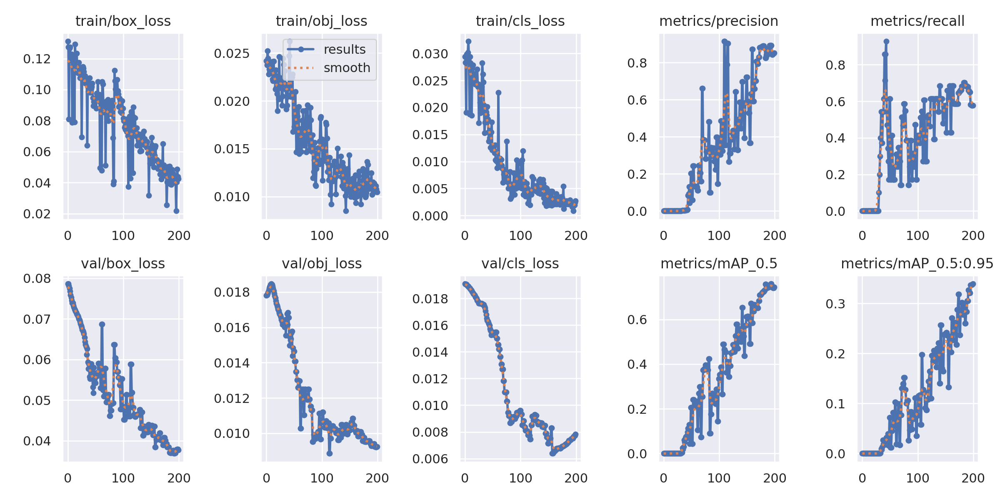

In [22]:
## we can also output some old school graphs if the tensorboard is not working

from utils.plots import plot_results ## plots results.txt as results.png
Image(filename = '/content/yolov5/runs/train/yolov5x_results/results.png',width = 1000) # view result.png

 Ground truth training data :


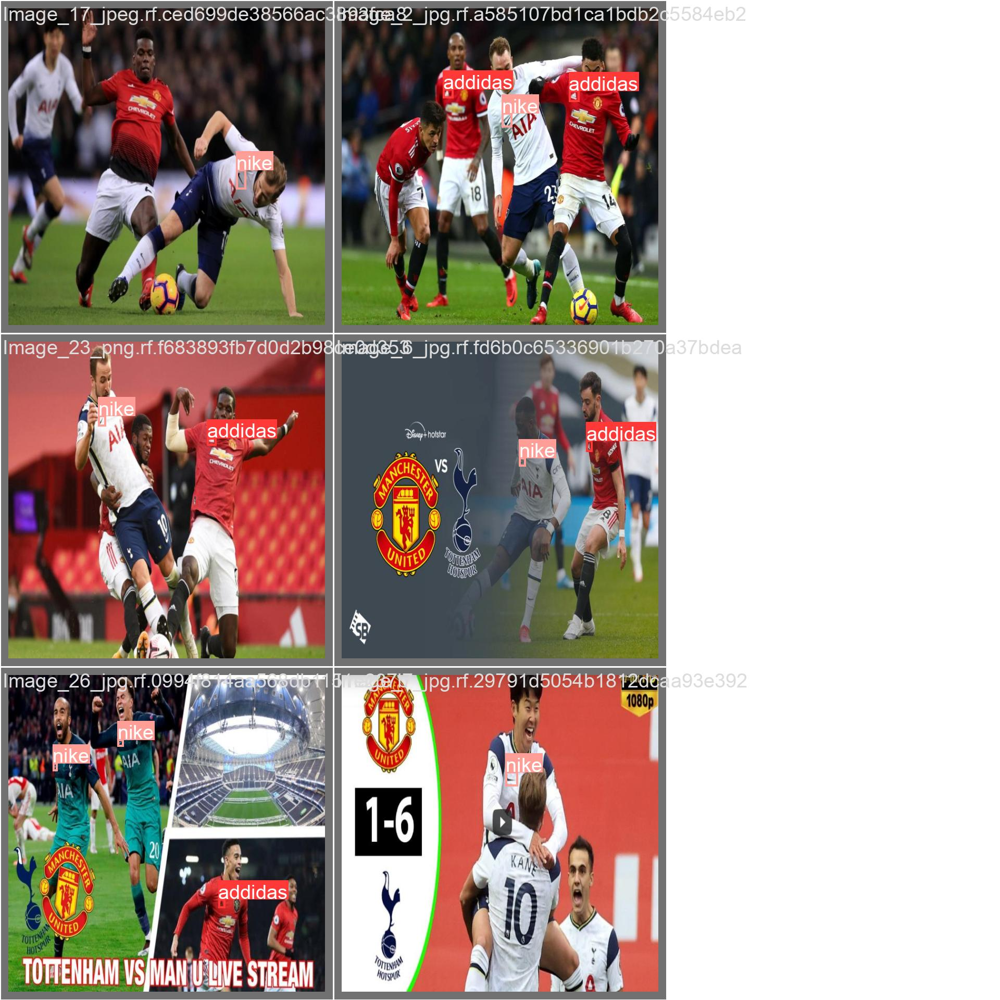

In [23]:
## first display our ground truth data

print(" Ground truth training data :")
Image(filename = '/content/yolov5/runs/train/yolov5x_results/val_batch0_labels.jpg',width = 900)

Ground truth augmented training data : 


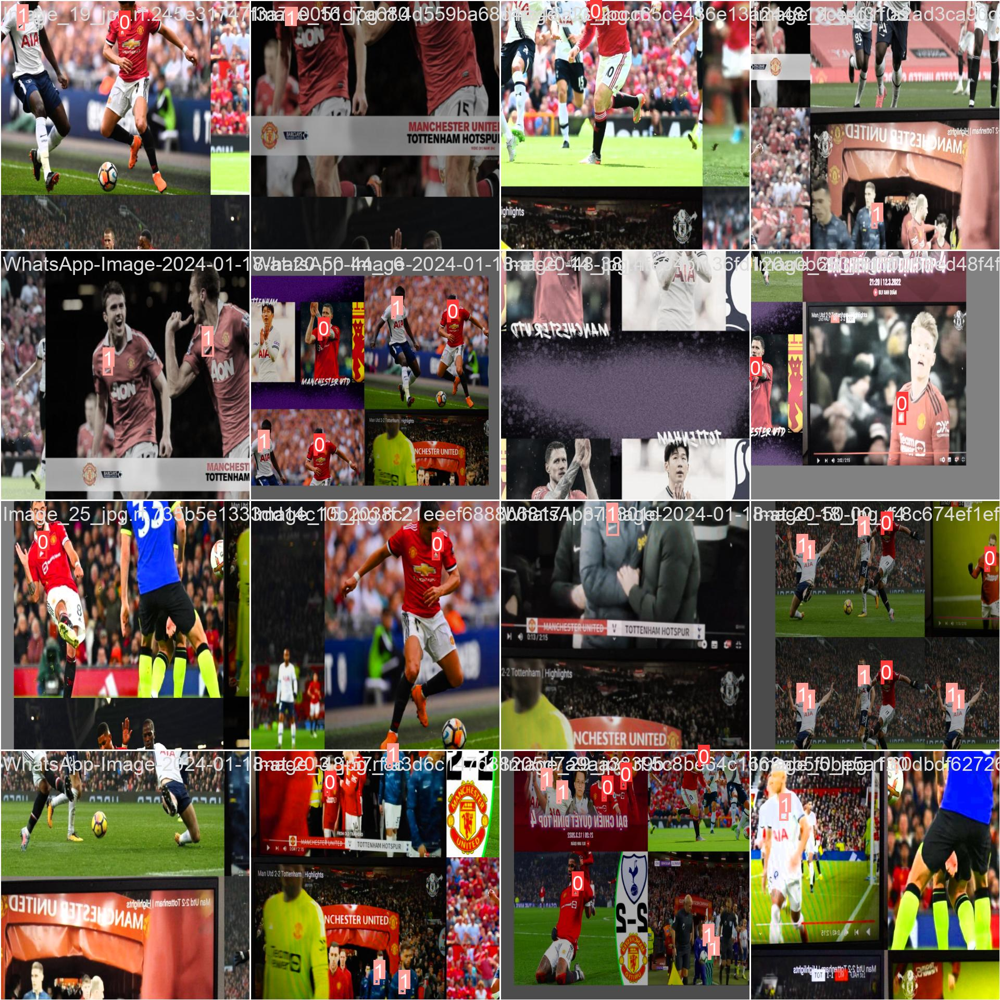

In [24]:
## primt out at augmented training examples

print("Ground truth augmented training data : ")
Image(filename= "/content/yolov5/runs/train/yolov5x_results/train_batch0.jpg",width = 900)

In [25]:
## run infrence with trained weights

## trained weights are saved by default in our weights folder
%ls runs/

train/


In [26]:
%ls runs/train/yolov5x_results/weights

best.pt  last.pt


In [27]:
## whwn we ran this we saw 0..7 sec inference time that is 140 fps on a TESLA P100
## use the best weights

%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5x_results/weights/best.pt --img 608 --conf 0.5 --source ../valid/images

/content/yolov5
detect: weights=['runs/train/yolov5x_results/weights/best.pt'], source=../valid/images, data=data/coco128.yaml, imgsz=[608, 608], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-278-g050c72c Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5x summary: 322 layers, 86180143 parameters, 0 gradients, 203.8 GFLOPs
image 1/6 /content/valid/images/Image_17_jpeg.rf.ced699de38566ac3893fca80d08ebe19.jpg: 608x608 (no detections), 82.4ms
image 2/6 /content/valid/images/Image_23_png.rf.f683893fb7d0d2b98ce0d3535273dc92.jpg: 608x608 (no detections), 56.1ms
WARNING ⚠️ NMS time limit 0.550s exceeded
image 3/6 /conten

In [28]:
## export trained weights for future inference

from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [29]:
%cp /content/yolov5/runs/train/yolov5x_results/weights/best.pt /content/gdrive/MyDrive/object_football/best1.pt

In [30]:
!git status

On branch master
Your branch is up to date with 'origin/master'.

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	models/custom_yolov5x.yaml

nothing added to commit but untracked files present (use "git add" to track)


In [31]:
!git add .

In [32]:
!git status

On branch master
Your branch is up to date with 'origin/master'.

Changes to be committed:
  (use "git restore --staged <file>..." to unstage)
	new file:   models/custom_yolov5x.yaml



In [33]:
ls

benchmarks.py    data/       LICENSE         README.md         segment/        val.py
CITATION.cff     detect.py   models/         README.zh-CN.md   train.py        yolov5x.pt
classify/        export.py   __pycache__/    requirements.txt  tutorial.ipynb
CONTRIBUTING.md  hubconf.py  pyproject.toml  runs/             utils/


In [34]:
pwd()

'/content/yolov5'

In [35]:
cd ..


/content


In [36]:
!git status

fatal: not a git repository (or any of the parent directories): .git


In [37]:
!git init

hint: Using 'master' as the name for the initial branch. This default branch name
hint: is subject to change. To configure the initial branch name to use in all
hint: of your new repositories, which will suppress this warning, call:
hint: 
hint: 	git config --global init.defaultBranch <name>
hint: 
hint: Names commonly chosen instead of 'master' are 'main', 'trunk' and
hint: 'development'. The just-created branch can be renamed via this command:
hint: 
hint: 	git branch -m <name>
Initialized empty Git repository in /content/.git/


In [38]:
!git status

On branch master

No commits yet

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	.config/
	README.dataset.txt
	README.roboflow.txt
	data.yaml
	gdrive/
	sample_data/
	test/
	train/
	valid/
	yolov5/

nothing added to commit but untracked files present (use "git add" to track)


In [40]:
!git status

On branch master

No commits yet

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	.config/
	README.dataset.txt
	README.roboflow.txt
	data.yaml
	gdrive/
	sample_data/
	test/
	train/
	valid/
	yolov5/

nothing added to commit but untracked files present (use "git add" to track)


In [41]:
!git add yolov5

hint: You've added another git repository inside your current repository.
hint: Clones of the outer repository will not contain the contents of
hint: the embedded repository and will not know how to obtain it.
hint: If you meant to add a submodule, use:
hint: 
hint: 	git submodule add <url> yolov5
hint: 
hint: If you added this path by mistake, you can remove it from the
hint: index with:
hint: 
hint: 	git rm --cached yolov5
hint: 
hint: See "git help submodule" for more information.


In [42]:
!git status

On branch master

No commits yet

Changes to be committed:
  (use "git rm --cached <file>..." to unstage)
	new file:   yolov5

Changes not staged for commit:
  (use "git add <file>..." to update what will be committed)
  (use "git restore <file>..." to discard changes in working directory)
  (commit or discard the untracked or modified content in submodules)
	modified:   yolov5 (modified content)

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	.config/
	README.dataset.txt
	README.roboflow.txt
	data.yaml
	gdrive/
	sample_data/
	test/
	train/
	valid/



In [43]:
!git add data.yaml test train valid

In [44]:
!git status

On branch master

No commits yet

Changes to be committed:
  (use "git rm --cached <file>..." to unstage)
	new file:   data.yaml
	new file:   test/images/Image_22_jpg.rf.2b345b362daf0cf22931e32ffafcdd46.jpg
	new file:   test/images/Image_27_jpg.rf.00b73718b09af49fd6de343eec7540bf.jpg
	new file:   test/images/WhatsApp-Image-2024-01-18-at-20-49-16_2eaf354e_jpg.rf.db142bbdae78c218c50a382fa9b3a31c.jpg
	new file:   test/labels/Image_22_jpg.rf.2b345b362daf0cf22931e32ffafcdd46.txt
	new file:   test/labels/Image_27_jpg.rf.00b73718b09af49fd6de343eec7540bf.txt
	new file:   test/labels/WhatsApp-Image-2024-01-18-at-20-49-16_2eaf354e_jpg.rf.db142bbdae78c218c50a382fa9b3a31c.txt
	new file:   train/images/Image_12_jpg.rf.1371ba11ee51695ed8450cbc027e4cba.jpg
	new file:   train/images/Image_13_jpg.rf.5ce436e13a244813ce4f310c248d047a.jpg
	new file:   train/images/Image_14_jpg.rf.e94bf136fd126a0b65336f50b2d04ad3.jpg
	new file:   train/images/Image_15_jpg.rf.21eeef6888b68171b873801d7912d7a8.jpg
	new file: 

In [45]:
!git remote add origin https://github.com/pratikrathod08/football_detection.git

In [46]:
!git remote -v

origin	https://github.com/pratikrathod08/football_detection.git (fetch)
origin	https://github.com/pratikrathod08/football_detection.git (push)


In [47]:
!git commit -m "files added"

Author identity unknown

*** Please tell me who you are.

Run

  git config --global user.email "you@example.com"
  git config --global user.name "Your Name"

to set your account's default identity.
Omit --global to set the identity only in this repository.

fatal: unable to auto-detect email address (got 'root@7ad347dfd73b.(none)')


In [48]:
!git config --global user.email "pratikr1521998@gmail.com"
!git config --global user.name "pratikrathod08"

In [49]:
!git commit -m "files added"

[master (root-commit) 6feed22] files added
 64 files changed, 68 insertions(+)
 create mode 100644 data.yaml
 create mode 100644 test/images/Image_22_jpg.rf.2b345b362daf0cf22931e32ffafcdd46.jpg
 create mode 100644 test/images/Image_27_jpg.rf.00b73718b09af49fd6de343eec7540bf.jpg
 create mode 100644 test/images/WhatsApp-Image-2024-01-18-at-20-49-16_2eaf354e_jpg.rf.db142bbdae78c218c50a382fa9b3a31c.jpg
 create mode 100644 test/labels/Image_22_jpg.rf.2b345b362daf0cf22931e32ffafcdd46.txt
 create mode 100644 test/labels/Image_27_jpg.rf.00b73718b09af49fd6de343eec7540bf.txt
 create mode 100644 test/labels/WhatsApp-Image-2024-01-18-at-20-49-16_2eaf354e_jpg.rf.db142bbdae78c218c50a382fa9b3a31c.txt
 create mode 100644 train/images/Image_12_jpg.rf.1371ba11ee51695ed8450cbc027e4cba.jpg
 create mode 100644 train/images/Image_13_jpg.rf.5ce436e13a244813ce4f310c248d047a.jpg
 create mode 100644 train/images/Image_14_jpg.rf.e94bf136fd126a0b65336f50b2d04ad3.jpg
 create mode 100644 train/images/Image_15_jpg.r

In [50]:
!git push -u origin main

error: src refspec main does not match any
error: failed to push some refs to 'https://github.com/pratikrathod08/football_detection.git'


In [51]:
!git push origin main

error: src refspec main does not match any
error: failed to push some refs to 'https://github.com/pratikrathod08/football_detection.git'


In [52]:
!git branch

* master


In [54]:
!git push -u origin master

fatal: could not read Username for 'https://github.com': No such device or address


In [57]:

# Push changes to GitHub
!git push origin master  # Replace 'main' with the branch you are working on


fatal: could not read Username for 'https://github.com': No such device or address


In [58]:
!git remote -v

origin	https://github.com/pratikrathod08/football_detection.git (fetch)
origin	https://github.com/pratikrathod08/football_detection.git (push)


In [59]:
!git push

fatal: The current branch master has no upstream branch.
To push the current branch and set the remote as upstream, use

    git push --set-upstream origin master



In [60]:
!git push -u origin master

fatal: could not read Username for 'https://github.com': No such device or address
